<a href="https://colab.research.google.com/github/eduguiu/slightdata/blob/master/Detectron2_slight_detectionv1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load Libraries

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-ywlc5ttt
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-ywlc5ttt
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266996 sha256=da1753a715152bd96a2a7ae5042c01479d8bddb796cd8086185338b98129efe2
  Stored in directory: /tmp/pip-ephem-wheel-cache-8j8vyf5d/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully uninstalled pycocotools-2.0
1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free

In [2]:
# install detectron2:
!pip install detectron2==0.1.2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html


In [0]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow
import os
import json
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## Treemap creation

- Slight
    - train
    - train_labels.csv

In [4]:
!mkdir slight
!mkdir slight/train
%cp /content/drive/My\ Drive/RCNN/OIDCv4_v1/Dataset/train/Street\ light/*.jpg /content/slight/train/
%cp /content/drive/My\ Drive/RCNN/OIDCv4_v1/Dataset/train/Street\ light/train_labels.csv /content/slight/

mkdir: cannot create directory ‘slight’: File exists
mkdir: cannot create directory ‘slight/train’: File exists


In [5]:
!mkdir slight/test
%cp /content/drive/My\ Drive/RCNN/OIDCv4_v1/Dataset/test/Street\ light/*.jpg /content/slight/test/

mkdir: cannot create directory ‘slight/test’: File exists


In [6]:
!ls content/slight/train

ls: cannot access 'content/slight/train': No such file or directory


# Get Data

In [0]:
dir = '/content/drive/My Drive/RCNN/slight/'
DatasetCatalog.clear()

In [8]:
import pandas as pd

df = pd.read_csv('slight/train_labels.csv')
df.head()


,Unnamed: 0,filename,height,width,class,xmin,xmax,ymin,ymax
0,1,0000e2d480cfb105.jpg,683,1024,Street light,582,600,473,519
1,2,0000e2d480cfb105.jpg,683,1024,Street light,703,710,475,524
2,3,0000e2d480cfb105.jpg,683,1024,Street light,760,771,487,530
3,4,000355964e21d5c7.jpg,635,1024,Street light,72,148,313,583
4,5,000355964e21d5c7.jpg,635,1024,Street light,304,328,448,553


In [0]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2

def get_slight_dicts(csv_file, img_dir):
    df = pd.read_csv(csv_file)
    df['filename'] = df['filename'].map(lambda x: img_dir+x)

    classes = ['Street light']

    df['class_int'] = df['class'].map(lambda x: classes.index(x))

    dataset_dicts = []
    for filename in df['filename'].unique().tolist():
        record = {}
        
        height, width = cv2.imread(filename).shape[:2]
        
        record["file_name"] = filename
        record["height"] = height
        record["width"] = width

        objs = []
        for index, row in df[(df['filename']==filename)].iterrows():
          obj= {
              'bbox': [row['xmin'], row['ymin'], row['xmax'], row['ymax']],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': row['class_int'],
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [0]:


from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['Street light']

for d in ["train"]:
  DatasetCatalog.register('slight/' + d, lambda d=d: get_slight_dicts('slight/' + d + '_labels.csv', 'slight/' + d+'/'))
  MetadataCatalog.get('slight/' + d).set(thing_classes=classes)
slight_metadata = MetadataCatalog.get('slight/train')





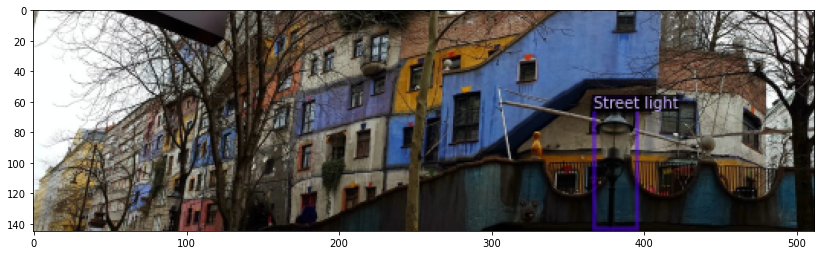

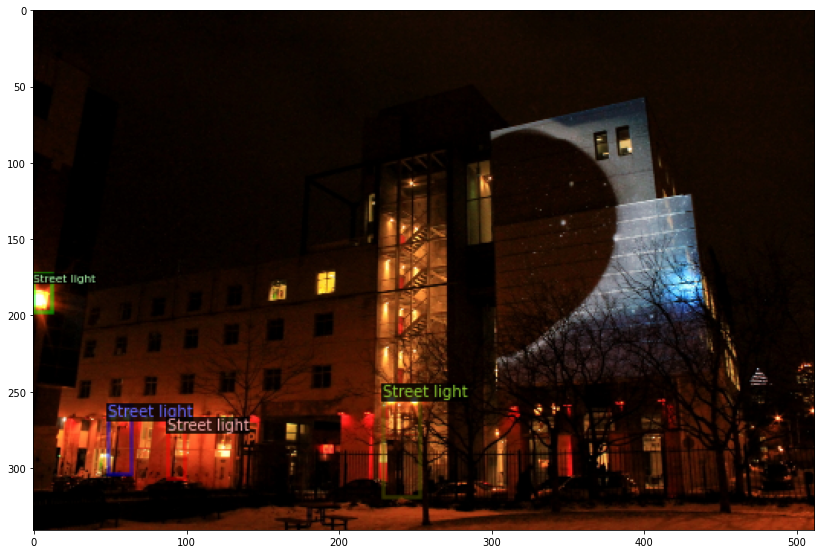

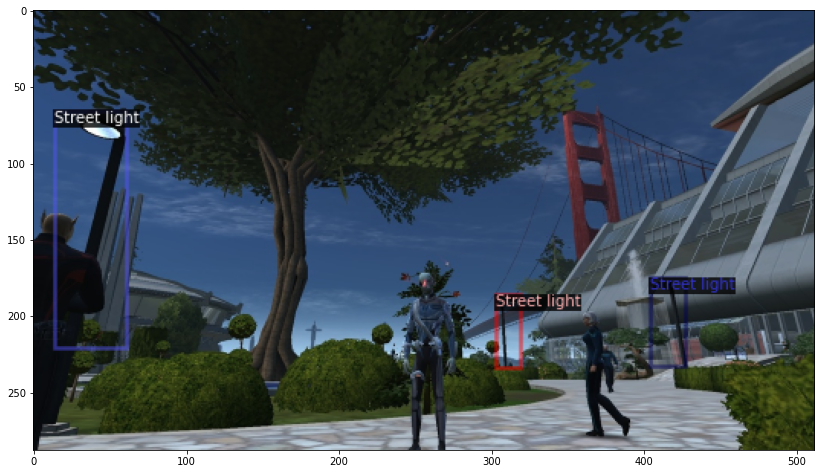

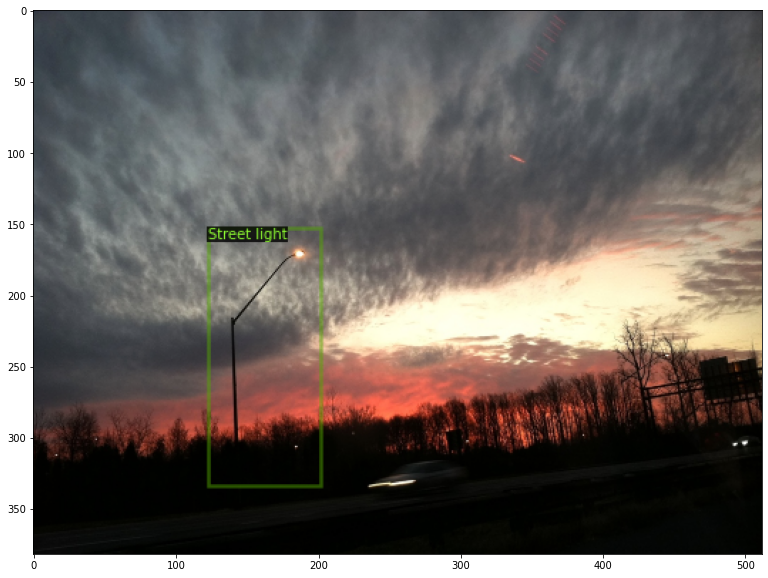

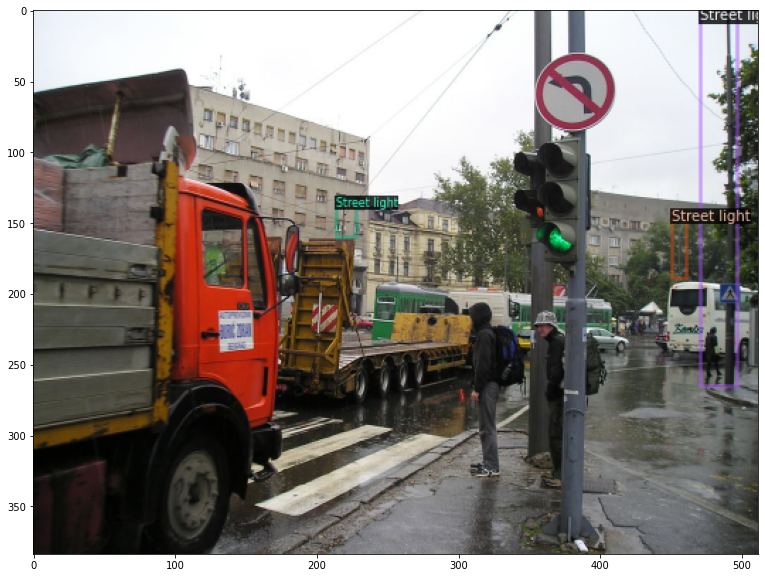

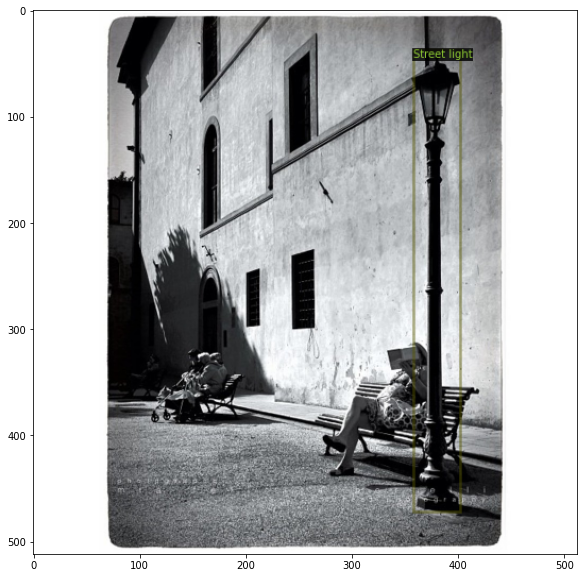

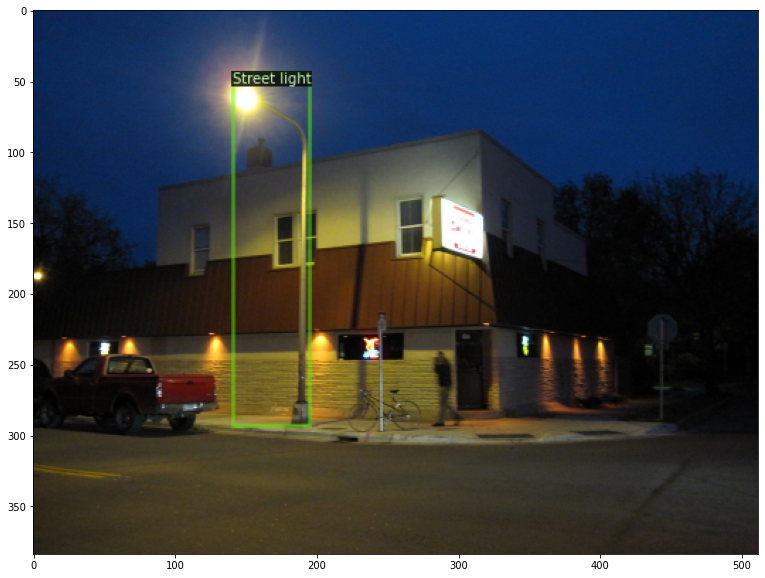

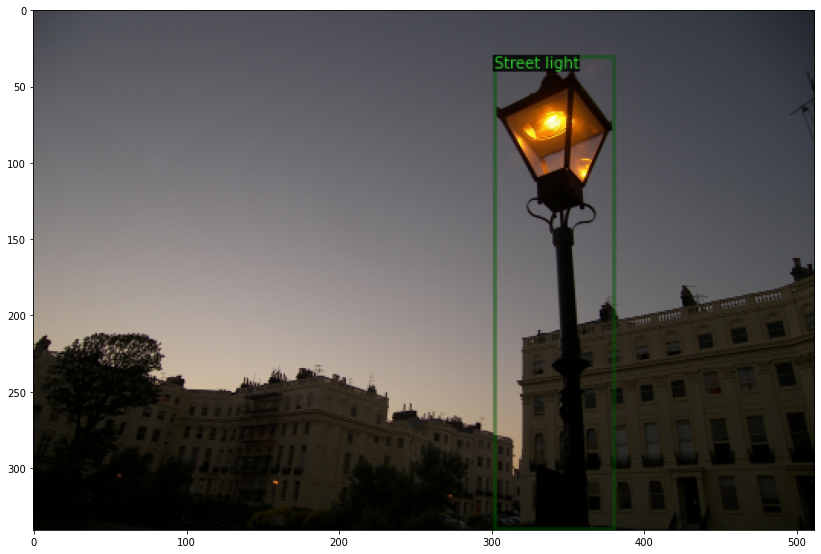

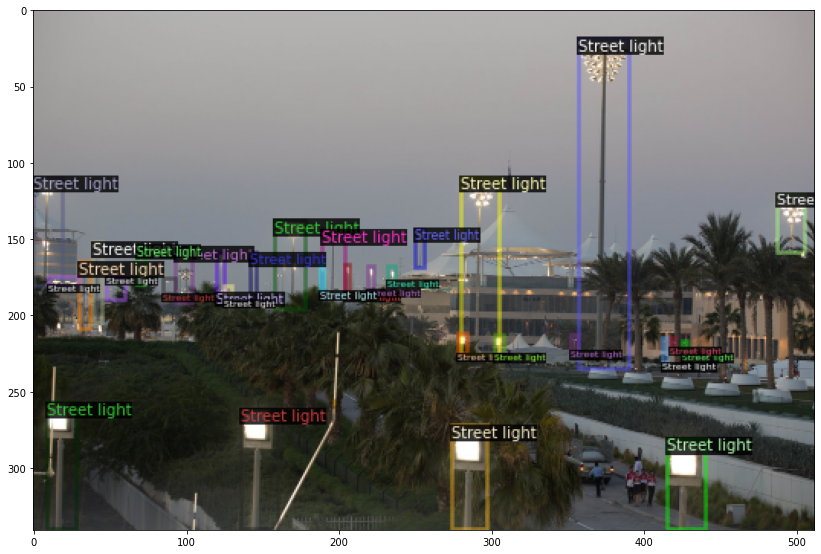

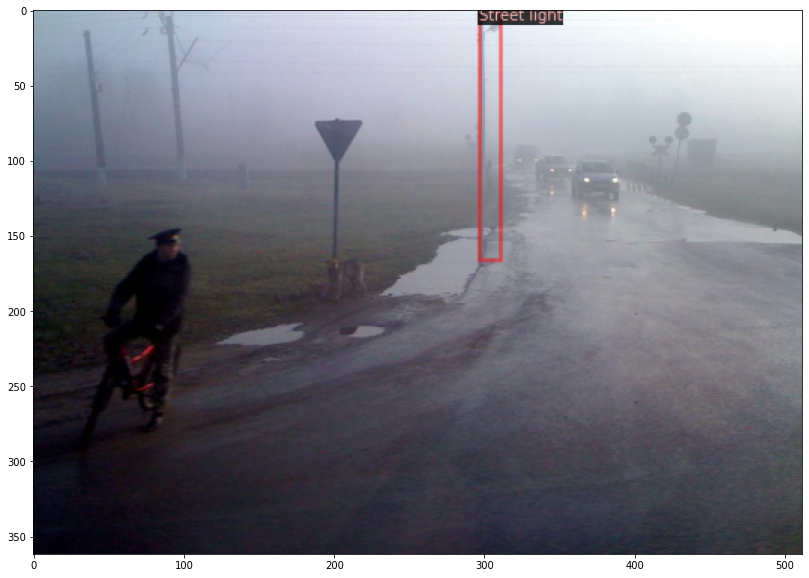

In [11]:
import random
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get('slight/train')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=slight_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()



# Train

In [12]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("slight/train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/faster_rcnn_R_50_FPN_3x/137849458/model_final_280758.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.000003  # pick a good LR
cfg.SOLVER.MAX_ITER = 9000    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (slight)
cfg.OUTPUT_DIR="./slight/output_r50"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[05/28 09:31:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.


[05/28 09:31:50 d2.engine.train_loop]: Starting training from iteration 0
[05/28 09:31:56 d2.utils.events]:  eta: 0:39:19  iter: 19  total_loss: 1.248  loss_cls: 0.649  loss_box_reg: 0.074  loss_rpn_cls: 0.267  loss_rpn_loc: 0.065  time: 0.2592  data_time: 0.0207  lr: 0.000000  max_mem: 2538M
[05/28 09:32:01 d2.utils.events]:  eta: 0:38:51  iter: 39  total_loss: 1.324  loss_cls: 0.655  loss_box_reg: 0.107  loss_rpn_cls: 0.342  loss_rpn_loc: 0.114  time: 0.2574  data_time: 0.0065  lr: 0.000000  max_mem: 2676M
[05/28 09:32:06 d2.utils.events]:  eta: 0:38:52  iter: 59  total_loss: 1.461  loss_cls: 0.653  loss_box_reg: 0.030  loss_rpn_cls: 0.618  loss_rpn_loc: 0.103  time: 0.2572  data_time: 0.0067  lr: 0.000000  max_mem: 2729M
[05/28 09:32:11 d2.utils.events]:  eta: 0:38:47  iter: 79  total_loss: 1.441  loss_cls: 0.659  loss_box_reg: 0.128  loss_rpn_cls: 0.431  loss_rpn_loc: 0.086  time: 0.2587  data_time: 0.0095  lr: 0.000000  max_mem: 2729M
[05/28 09:32:16 d2.utils.events]:  eta: 0:38:4

In [0]:
%cp /content/drive/My\ Drive/RCNN/OIDCv4_v1/Dataset/test/Street\ light/test_labels.csv /content/slight/

In [22]:
slight_metadata

Metadata(name='slight/test', thing_classes=['Street light'])

In [0]:
DatasetCatalog.clear()

In [0]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['Street light']

for d in ["test"]:
  DatasetCatalog.register('slight/' + d, lambda d=d: get_slight_dicts('slight/' + d + '_labels.csv', 'slight/' + d+'/'))
  MetadataCatalog.get('slight/' + d).set(thing_classes=classes)
slight_metadata = MetadataCatalog.get('slight/test')



In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set the testing threshold for this model
cfg.DATASETS.TEST = ('slight/test', )
predictor = DefaultPredictor(cfg)

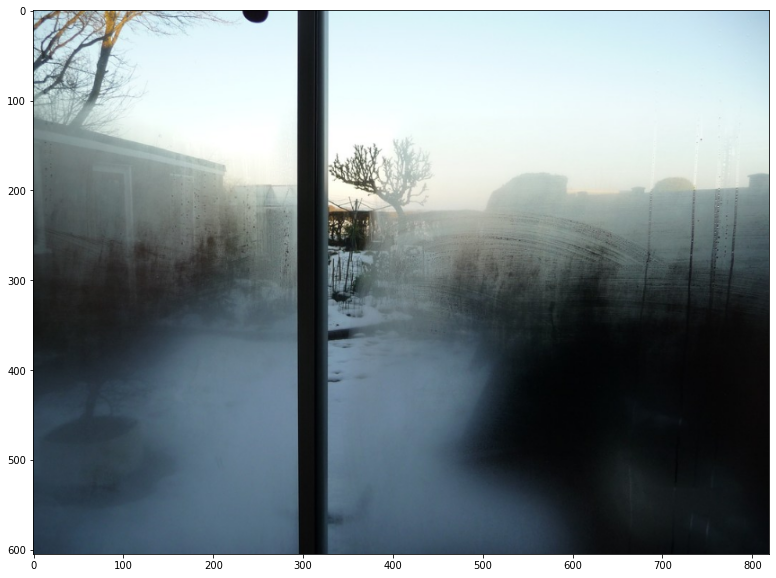

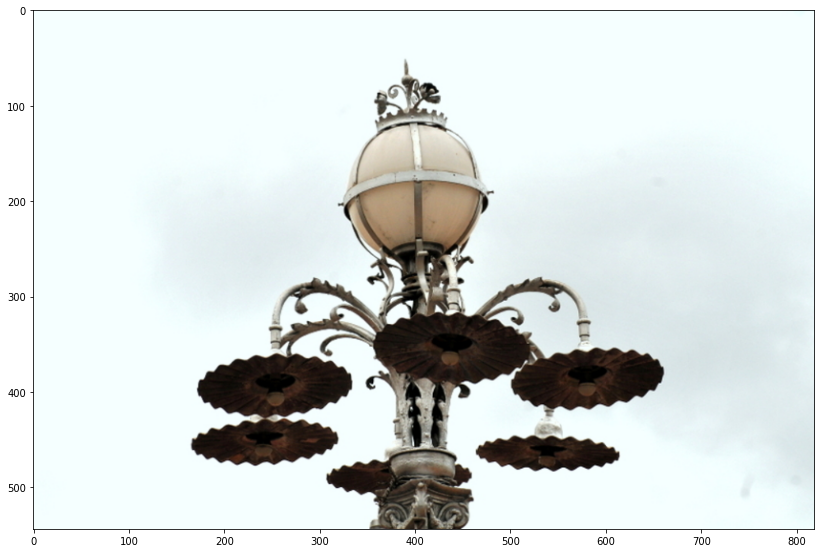

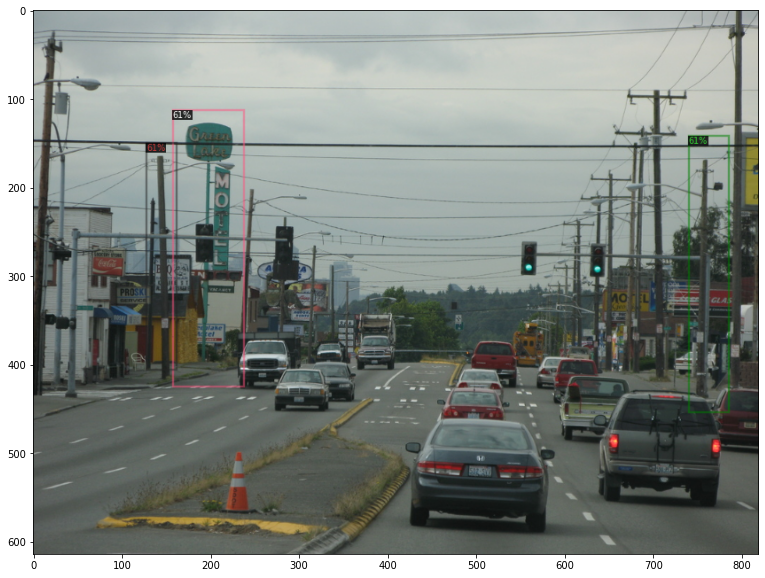

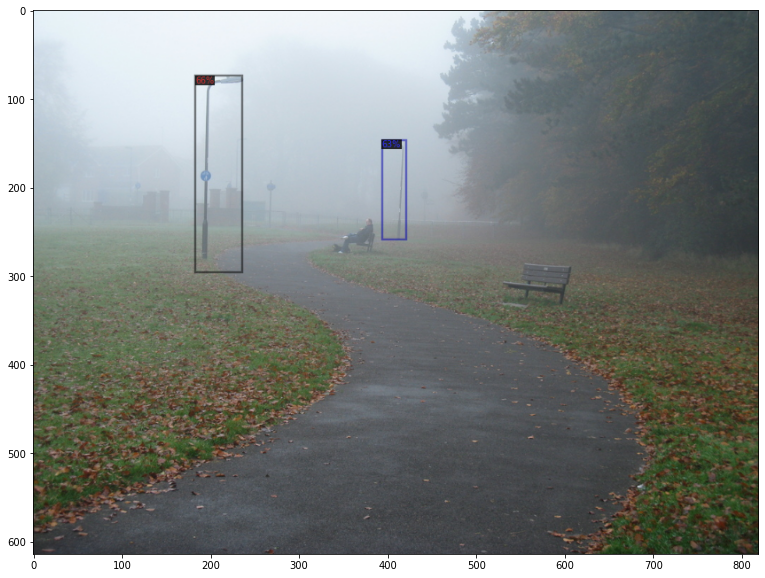

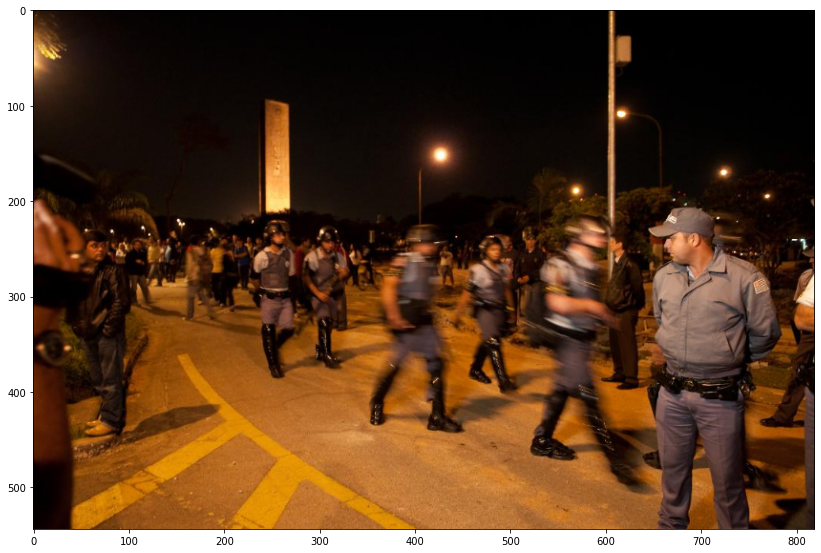

...

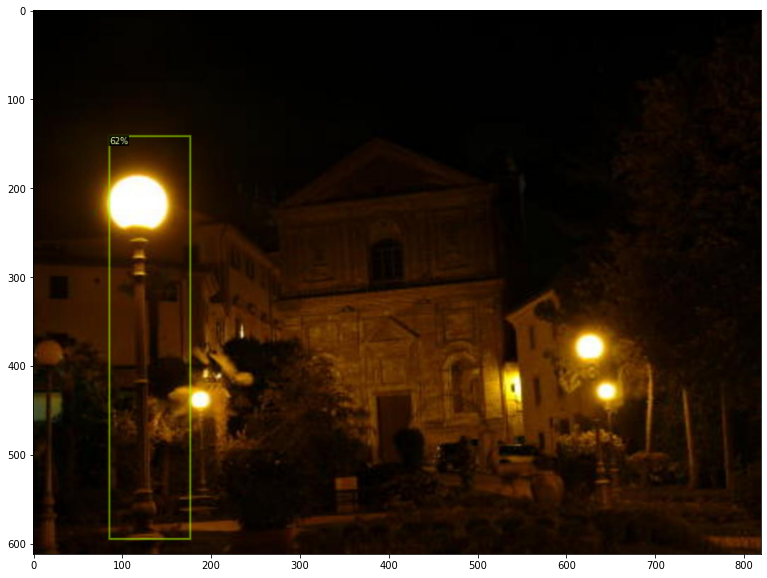

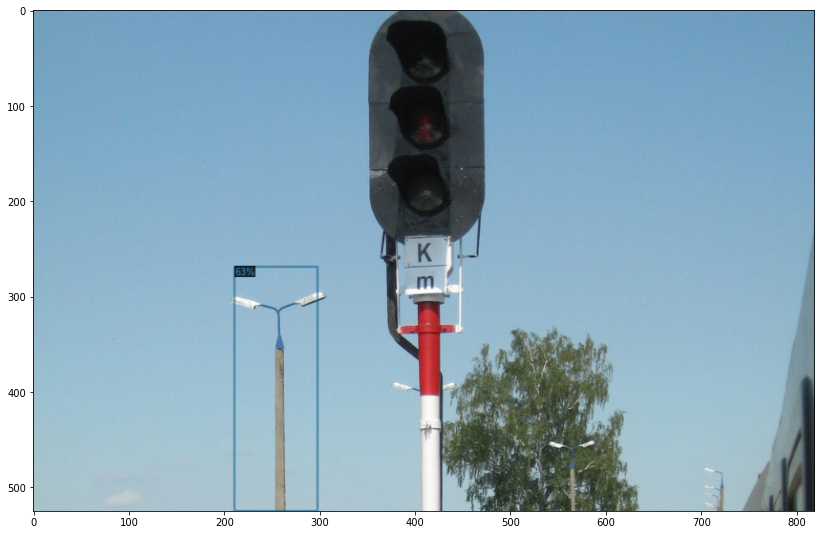

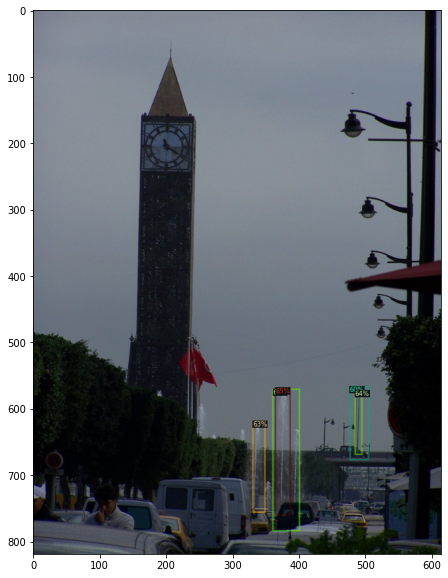

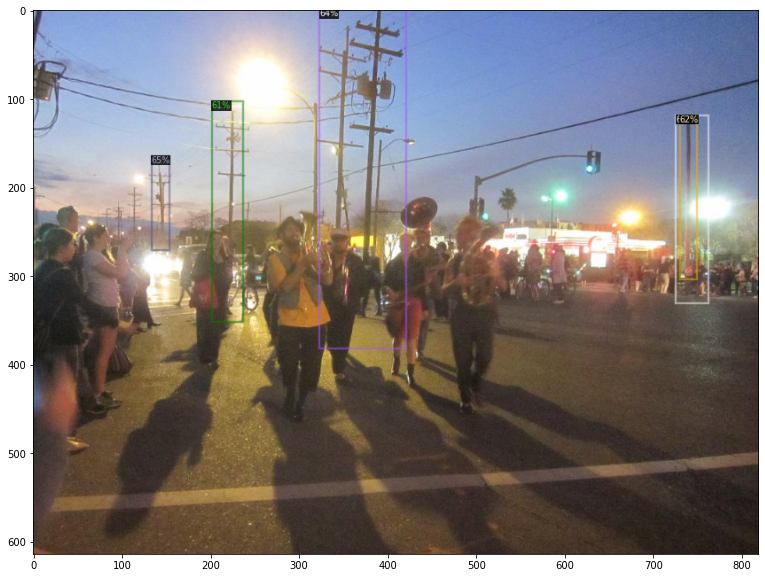

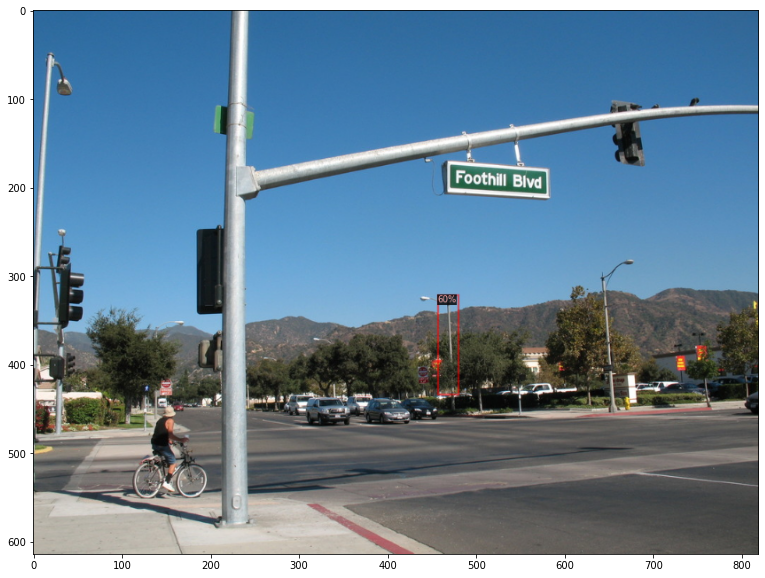

In [27]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = DatasetCatalog.get('slight/test')
for d in random.sample(dataset_dicts, 16):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=slight_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()